# 데이터 준비

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
!cp /gdrive/MyDrive/tmp/glaucoma.zip ./

In [ ]:
!unzip glaucoma.zip

Archive:  glaucoma.zip
   creating: test/
   creating: test/advanced/
  inflating: test/advanced/421.png   
  inflating: test/advanced/422.png   
  inflating: test/advanced/423.png   
  inflating: test/advanced/424.png   
  inflating: test/advanced/425.png   
  inflating: test/advanced/426.png   
  inflating: test/advanced/427.png   
  inflating: test/advanced/428.png   
  inflating: test/advanced/429.png   
  inflating: test/advanced/430.png   
  inflating: test/advanced/431.png   
  inflating: test/advanced/432.png   
  inflating: test/advanced/433.png   
  inflating: test/advanced/434.png   
  inflating: test/advanced/435.png   
  inflating: test/advanced/436.png   
  inflating: test/advanced/437.png   
  inflating: test/advanced/438.png   
  inflating: test/advanced/439.png   
  inflating: test/advanced/440.png   
  inflating: test/advanced/441.png   
  inflating: test/advanced/442.png   
  inflating: test/advanced/443.png   
  inflating: test/advanced/444.png   
  inflating: test/

# 데이터 섞자

In [ ]:
!rm -rf glaucoma
!rm -rf glaucoma.old
!rm -rf g
!rm -rf train
!rm -rf valid
!rm -rf test

압축 풀었더니 다음과 같이 상위 폴더 없이 풀린 경우
```
train/
valid/
test/

```

In [ ]:
!unzip -q glaucoma.zip
!mkdir glaucoma.old
!mv train glaucoma.old/
!mv valid glaucoma.old/
!mv test glaucoma.old/

압축을 풀었더니 다음과 같이 상위 폴더가 있는 경우
```
glaucoma/
    train/
    valid/
    test/
```

In [ ]:
# !unzip -q glaucoma.zip
# !mv glaucoma glaucoma.old

In [ ]:
!mkdir -p g/normal
!mkdir -p g/early
!mkdir -p g/advanced

!cp glaucoma.old/train/normal/* g/normal/
!cp glaucoma.old/valid/normal/* g/normal/
!cp glaucoma.old/test/normal/* g/normal/
!cp glaucoma.old/train/early/* g/early/
!cp glaucoma.old/valid/early/* g/early/
!cp glaucoma.old/test/early/* g/early/
!cp glaucoma.old/train/advanced/* g/advanced/
!cp glaucoma.old/valid/advanced/* g/advanced/
!cp glaucoma.old/test/advanced/* g/advanced/

!mkdir -p glaucoma/train/normal
!mkdir -p glaucoma/train/early
!mkdir -p glaucoma/train/advanced
!mkdir -p glaucoma/test/normal
!mkdir -p glaucoma/test/early
!mkdir -p glaucoma/test/advanced
!mkdir -p glaucoma/valid/normal
!mkdir -p glaucoma/valid/early
!mkdir -p glaucoma/valid/advanced

In [ ]:
import glob
import random
from shutil import copyfile, move

for category in ["normal", "early", "advanced"]:

  file_list = {}
  file_list = glob.glob("g/{}/*.png".format(category))
  random.shuffle(file_list)


  i1 = int(len(file_list)*0.8)
  i2 = int(len(file_list)*0.9)
  files = {
      'train':file_list[:i1],
      'valid':file_list[i1:i2],
      'test':file_list[i2:]
  }

  for data_type in ['train', 'valid', 'test']:
    target_dir = 'glaucoma/{}/{}/'.format(data_type, category)
    print("copy {} files to {}".format(len(files[data_type]), target_dir))
    for file_name in files[data_type]:
      move(file_name, target_dir)

copy 630 files to glaucoma/train/normal/
copy 79 files to glaucoma/valid/normal/
copy 79 files to glaucoma/test/normal/
copy 231 files to glaucoma/train/early/
copy 29 files to glaucoma/valid/early/
copy 29 files to glaucoma/test/early/
copy 373 files to glaucoma/train/advanced/
copy 47 files to glaucoma/valid/advanced/
copy 47 files to glaucoma/test/advanced/


# Vanilla CNN으로 학습

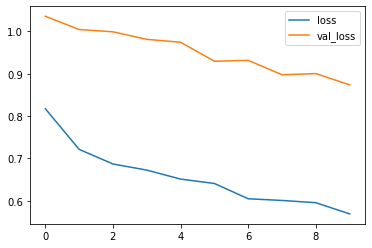

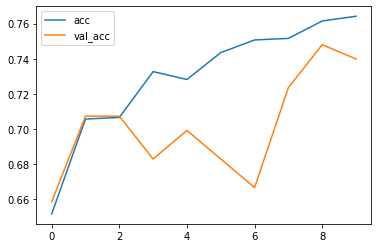

loss =  0.5691488981246948 , val_loss =  0.8735358715057373
18/18 [==============================] - 15s 843ms/step - loss: 0.5691 - acc: 0.7642 - val_loss: 0.8735 - val_acc: 0.7398


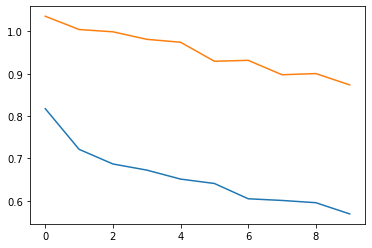

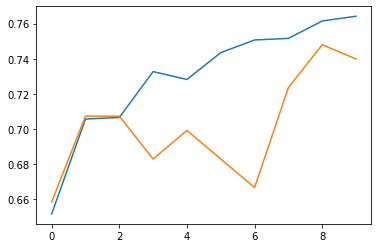

3/3 [==============================] - 1s 254ms/step - loss: 0.8563 - acc: 0.7419
loss= 0.8563461899757385
acc= 0.7419354915618896


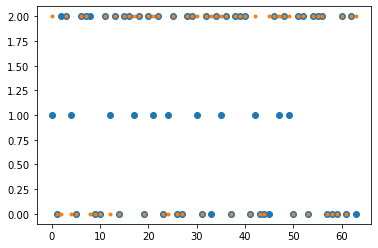

label category index = 1.0
predicted category index = 2
predicted category name = normal


In [ ]:
# copy from https://gist.github.com/stared/dfb4dfaf6d9a8501cd1cc8b8cb806d2e

from IPython.display import clear_output
from tensorflow.keras.callbacks import Callback

class PlotLosses(Callback):

  def on_train_begin(self, logs={}):
    self.epochs = []
    self.losses = []
    self.val_losses = []
    self.acces = []
    self.val_acces = []
    self.logs = []
    self.fig = plt.figure()


  def on_epoch_end(self, epoch, logs={}):

    self.epochs.append(epoch)
    self.losses.append(logs.get('loss'))
    self.val_losses.append(logs.get('val_loss'))
    self.acces.append(logs.get('acc'))
    self.val_acces.append(logs.get('val_acc'))

    clear_output(wait=True)
    plt.plot(self.epochs, self.losses, label="loss")
    plt.plot(self.epochs, self.val_losses, label="val_loss")
    plt.legend()
    plt.show();

    plt.plot(self.epochs, self.acces, label="acc")
    plt.plot(self.epochs, self.val_acces, label="val_acc")
    plt.legend()
    plt.show();

    print("loss = ", self.losses[-1], ", val_loss = ", self.val_losses[-1])



import os

import matplotlib.pyplot as plt
import numpy as np

from tensorflow import keras
from tensorflow.keras import optimizers
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dropout, Flatten, Dense, BatchNormalization, Conv2D, MaxPooling2D, Input
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

from tensorflow.keras.applications import efficientnet
from tensorflow.keras.applications import EfficientNetB2

preprocessor = efficientnet.preprocess_input

# conv_layers = EfficientNetB2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# conv_layers.trainable = True

model = keras.Sequential()

# model.add(conv_layers)
model.add(Input((224,224,3)))
model.add(Conv2D(32, (5,5), padding='same'))
model.add(Conv2D(32, (5,5), padding='same'))
model.add(Conv2D(32, (5,5), padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(32, (5,5), padding='same'))
model.add(Conv2D(32, (5,5), padding='same'))
model.add(Conv2D(32, (5,5), padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(64, (5,5), padding='same'))
model.add(Conv2D(64, (5,5), padding='same'))
model.add(Conv2D(64, (5,5), padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(64, (5,5), padding='same'))
model.add(Conv2D(64, (5,5), padding='same'))
model.add(Conv2D(64, (5,5), padding='same'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(3, activation='softmax'))

import tensorflow
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0001*0.1)
# model.compile(loss='sparse_categorical_crossentropy', optimizer="RMSprop", metrics=['acc'])
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['acc'])
model.summary()

BATCH_SIZE = 64

train_data_generator = ImageDataGenerator(
      rotation_range=10,
      width_shift_range=0.1,
      height_shift_range=0.1,
      horizontal_flip=True,
      vertical_flip=False,
      rescale=1/255.,
      validation_split=0.1
      # preprocessing_function=preprocessor
).flow_from_directory(
      "glaucoma/train",
      target_size=(224,224),
      batch_size=BATCH_SIZE,
      class_mode='sparse',
      subset="training"
)


valid_data_generator = ImageDataGenerator(
      rescale=1/255.,
      validation_split=0.1      
      # preprocessing_function=preprocessor
).flow_from_directory(
      "glaucoma/train",
      target_size=(224,224),
      batch_size=BATCH_SIZE,
      class_mode='sparse',
      subset="validation"
)

test_data_generator = ImageDataGenerator(
      rescale=1/255.,
      # preprocessing_function=preprocessor
).flow_from_directory(
      "glaucoma/test",
      target_size=(224,224),
      batch_size=BATCH_SIZE,
      class_mode='sparse'
)


plot_losses = PlotLosses()
history = model.fit(
      train_data_generator,
      validation_data=valid_data_generator,
      epochs=10,
      callbacks=[plot_losses]
)


plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.show()

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.show()

loss, acc = model.evaluate(test_data_generator)
print("loss=", loss)
print("acc=", acc)



batch_x, batch_y = test_data_generator.next()
y_ = model.predict(batch_x)
predicted = np.argmax(y_, axis=-1)

plt.plot(batch_y[:100], "o")
plt.plot(predicted[:100], '.')
plt.show()


custom_labels = list(test_data_generator.class_indices.keys())
print("label category index =", batch_y[0])
print("predicted category index =", predicted[0])
print("predicted category name =", custom_labels[predicted[0]])


# Grad Cam

In [ ]:
!pip install --upgrade tf-keras-vis matplotlib

     |████████████████████████████████| 53 kB 2.1 MB/s 
     |████████████████████████████████| 11.2 MB 27.6 MB/s 
     |████████████████████████████████| 890 kB 64.6 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
batch_x, batch_y = next(iter(test_data_generator))
images = batch_x
labels = batch_y.astype(int)

In [ ]:
import tensorflow as tf
from matplotlib import cm
from matplotlib import pyplot as plt
from tf_keras_vis.utils import normalize

def draw_gradcam(model, images, labels, preprocess):
    
    labels = labels.astype(int)
    if preprocess is None:
        X = images
    else:
        X = preprocess(images)


    def loss(output):
        return [ output[i][labels[i]] for i in range(len(labels)) ]

    def model_modifier(m):
        m.layers[-1].activation = tf.keras.activations.linear
        return m

    from tf_keras_vis.gradcam import GradcamPlusPlus

    gradcam = GradcamPlusPlus(model, model_modifier, clone=False)

    TARGET_LAYER_NUMBER = -1 # 마지막 층
    # Generate heatmap with GradCAM++
    cam = gradcam(loss, X, penultimate_layer=TARGET_LAYER_NUMBER)



    y_ = model.predict(images)
    predicted = np.argmax(y_, axis=-1)

    for i in range(len(images)):
        print("truth=", labels[i], "predicted=", predicted[i])
        heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
        plt.imshow(images[i])
        plt.imshow(heatmap, cmap='jet', alpha=0.5)
        plt.show()
            

truth= 0 predicted= 0


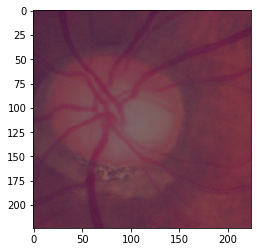

truth= 2 predicted= 0


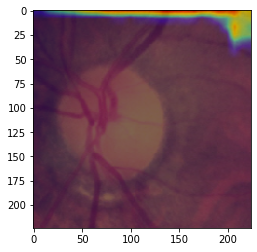

truth= 0 predicted= 0


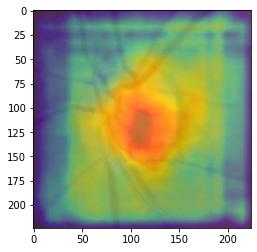

truth= 2 predicted= 2


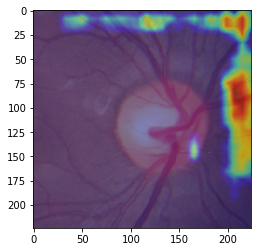

truth= 0 predicted= 0


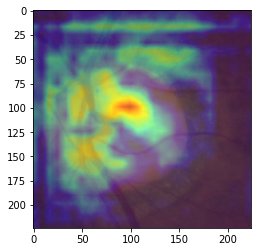

truth= 2 predicted= 2


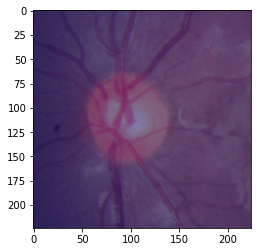

truth= 1 predicted= 2


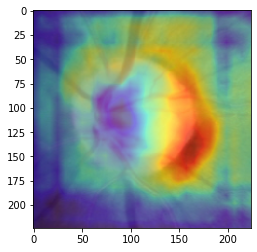

truth= 1 predicted= 0


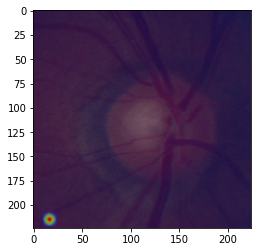

truth= 2 predicted= 2


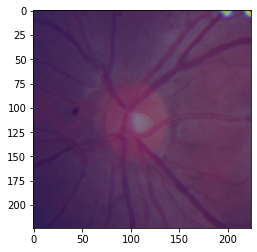

truth= 2 predicted= 2


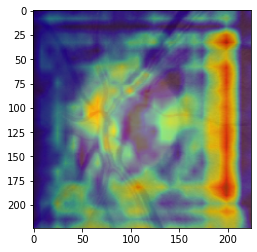

truth= 0 predicted= 0


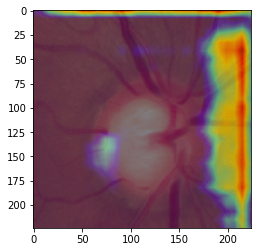

truth= 2 predicted= 0


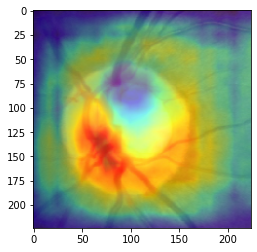

truth= 0 predicted= 2


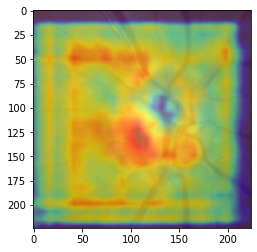

truth= 2 predicted= 0


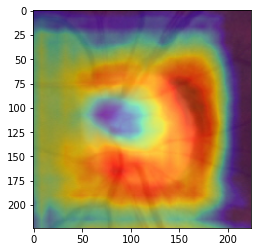

truth= 2 predicted= 2


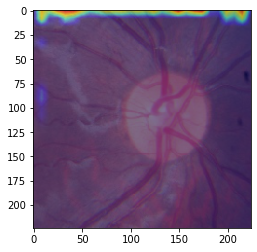

truth= 2 predicted= 2


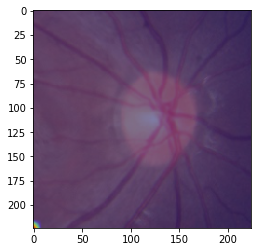

truth= 0 predicted= 0


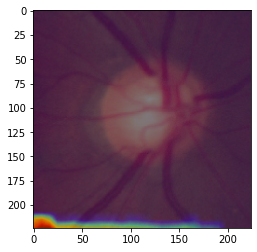

truth= 1 predicted= 0


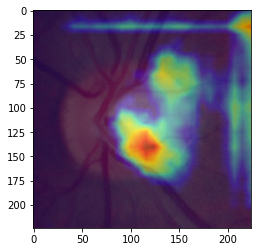

truth= 0 predicted= 2


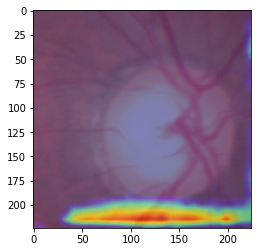

truth= 2 predicted= 2


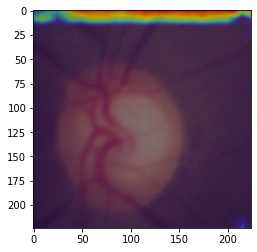

truth= 0 predicted= 0


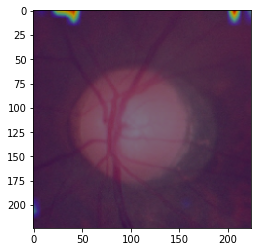

truth= 0 predicted= 0


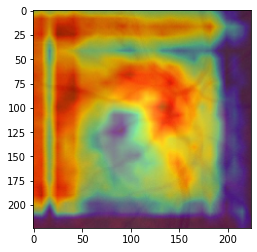

truth= 1 predicted= 0


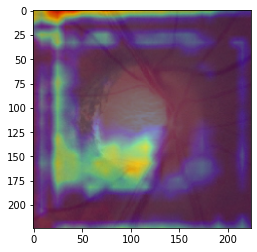

truth= 2 predicted= 2


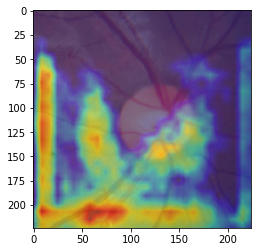

truth= 2 predicted= 2


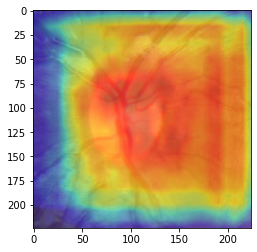

truth= 2 predicted= 2


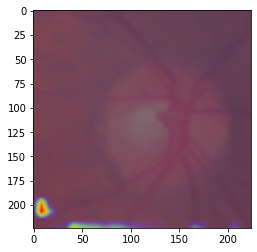

truth= 1 predicted= 0


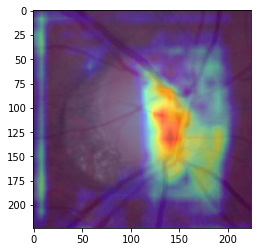

truth= 2 predicted= 2


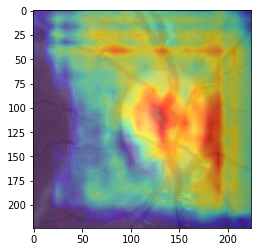

truth= 1 predicted= 2


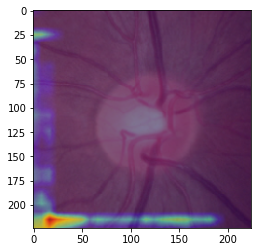

truth= 1 predicted= 2


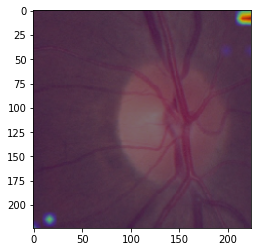

truth= 2 predicted= 2


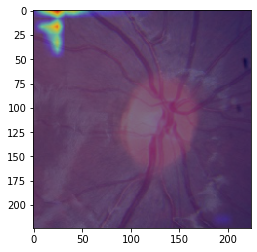

truth= 0 predicted= 0


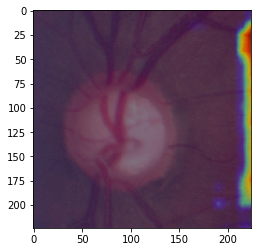

truth= 2 predicted= 2


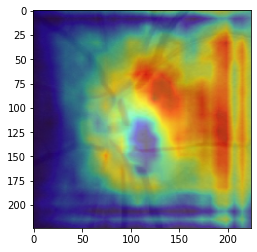

truth= 0 predicted= 0


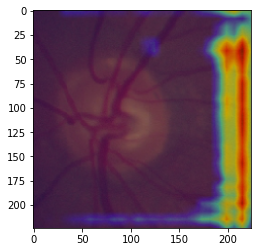

truth= 1 predicted= 0


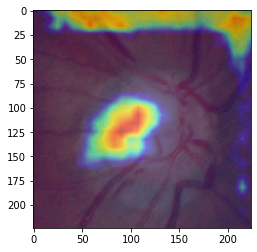

truth= 0 predicted= 0


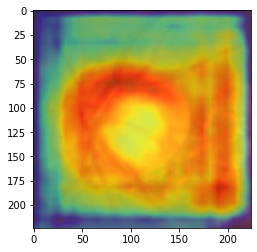

truth= 1 predicted= 2


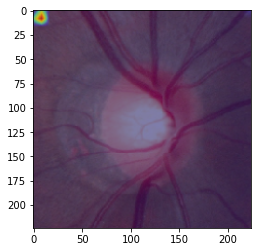

truth= 2 predicted= 2


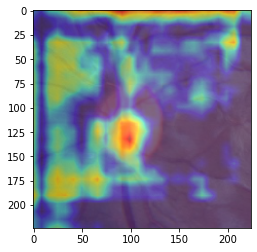

truth= 0 predicted= 0


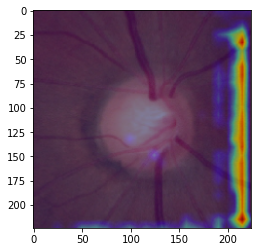

truth= 2 predicted= 2


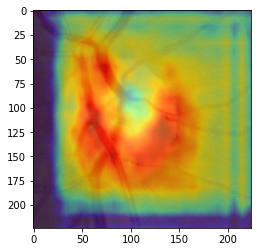

truth= 2 predicted= 2


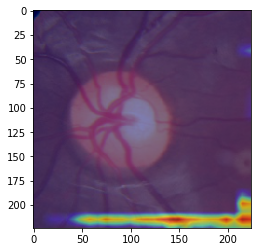

truth= 2 predicted= 2


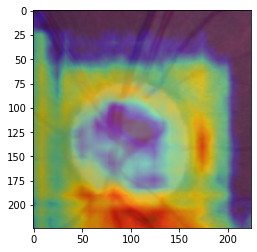

truth= 2 predicted= 2


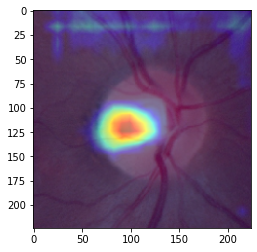

truth= 2 predicted= 2


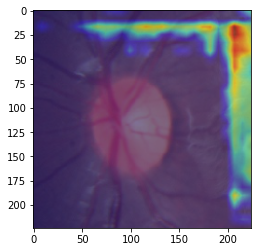

truth= 2 predicted= 2


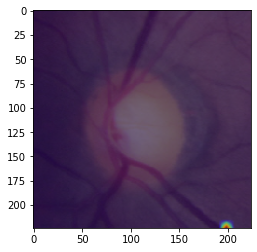

truth= 0 predicted= 0


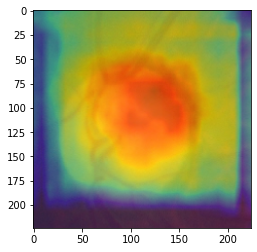

truth= 2 predicted= 2


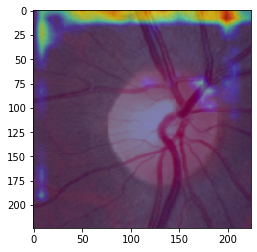

truth= 0 predicted= 0


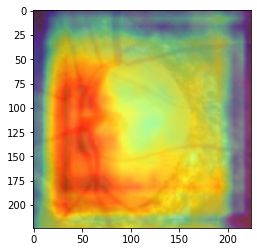

truth= 1 predicted= 2


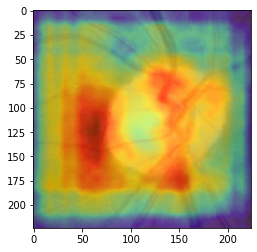

truth= 1 predicted= 0


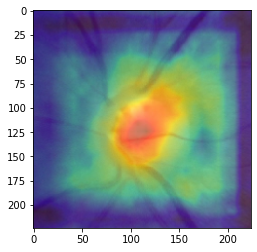

truth= 2 predicted= 2


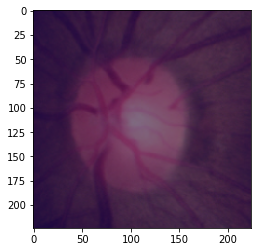

truth= 2 predicted= 2


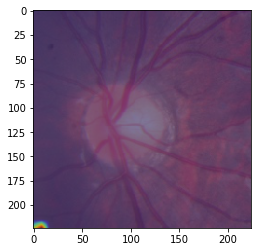

truth= 2 predicted= 2


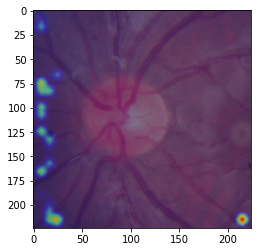

truth= 2 predicted= 2


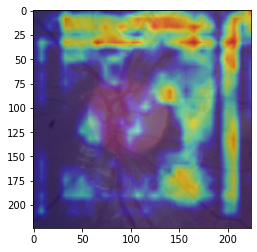

truth= 2 predicted= 2


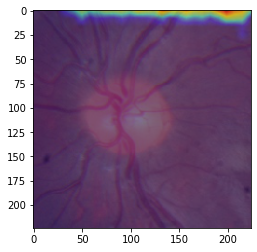

truth= 2 predicted= 2


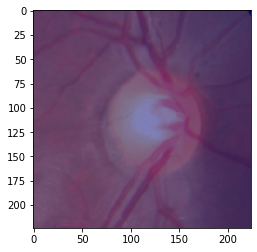

truth= 2 predicted= 2


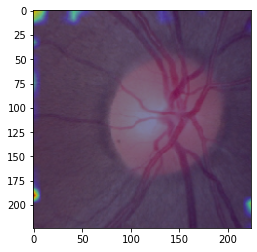

truth= 0 predicted= 0


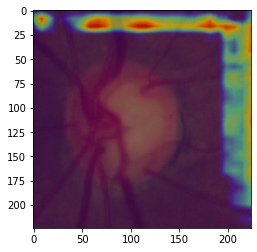

truth= 0 predicted= 0


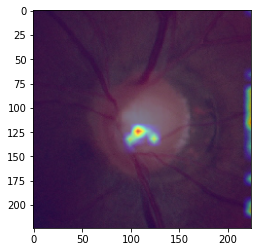

truth= 2 predicted= 2


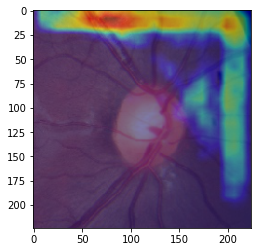

truth= 1 predicted= 2


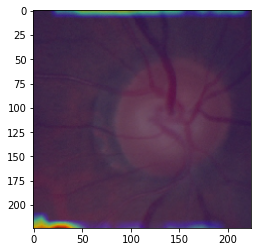

truth= 0 predicted= 0


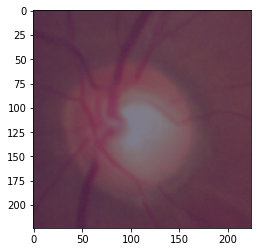

truth= 0 predicted= 0


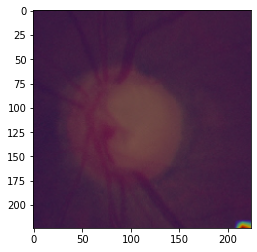

truth= 1 predicted= 2


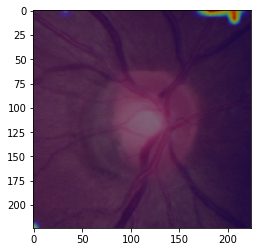

In [ ]:
def preprocess(img):
    return img

draw_gradcam(model, images, labels, preprocess)

In [ ]:
import tensorflow as tf
from matplotlib import cm
from matplotlib import pyplot as plt
from tf_keras_vis.utils import normalize

def draw_fast_score_gradcam(model, images, labels, preprocess=None):

    labels = labels.astype(int)
    if preprocess is None:
        X = images
    else:
        X = preprocess(images)

    def loss(output):
        return [ output[i][labels[i]] for i in range(len(labels)) ]

    def model_modifier(m):
        m.layers[-1].activation = tf.keras.activations.linear
        return m    

    from tf_keras_vis.scorecam import ScoreCAM

    scorecam = ScoreCAM(model, model_modifier, clone=False)

    TARGET_LAYER_NUMBER = -1 # 마지막 층
    cam = scorecam(loss, X, penultimate_layer=TARGET_LAYER_NUMBER, max_N=10)

    cam = normalize(cam)



    for i in range(len(images)):
        heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
        plt.imshow(images[i])
        plt.imshow(heatmap, cmap='jet', alpha=0.5)
        plt.show()                


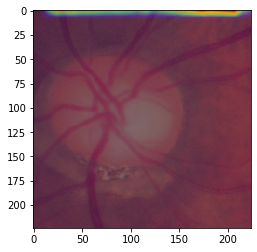

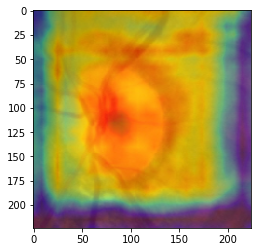

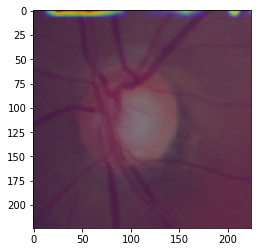

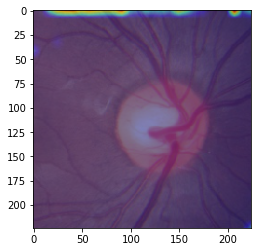

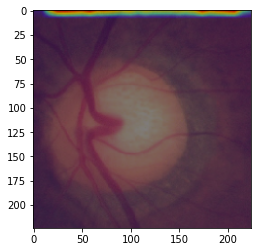

...

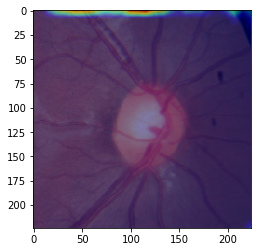

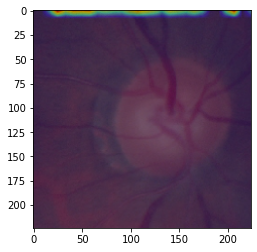

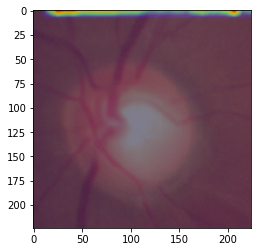

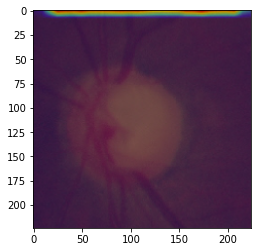

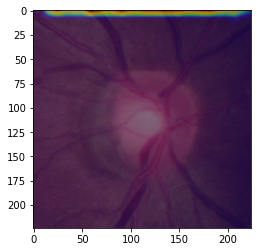

In [ ]:
def preprocess(img):
    return img
    
draw_fast_score_gradcam(model, images, labels, preprocess)